# Прогнозирование стоимости автомобиля с auto.ru  по его характеристикам

**Цель:** обучить лучшую модель для предсказания цен на автомобили на auto.ru

**Задачи:**

- Собрать тренировочный датасет/парсинг данных
- EDA и визуализация данных
- Поработать над очисткой и обогащением данных
- Оценить важность признаков для модели
- Обучить модель логистической регрессии
- Применить методы машинного обучения для улучшения прогнозирования цены автомобиля
- Настройка гиперпараметров модели
- Бэггинг/Стэкинг
- Submission на Kaggle


**Описание датасета:**

Данные - это набор характеристик автомобилей, выставленных на продажу: марка, тип кузова, дата выпуска модели, объем двигателя и т.д. Цена автомобиля является целевой переменной. Тренировочный датасет сформирован с помощью парсинга данных с сайта Auto.ru. Парсинг осуществлен с учетом признаков, имеющихся в тестовом датасете, всего 34686 наблюдений, и ограничен по году выпуска с 2005 по 2020 и статусом "с пробегом", в нем отсутствуют машины с флагом "продан". Всего в собранном тренировочном датасете 47423 наблюдения. Необходимо определить лучший алгоритм для предсказания цен на автомобили. Предсказания цены автомобиля по различным характеристикам относится к задаче логистической регрессии.

In [1]:
# импортируем необходимые модули и библиотеки
import numpy as np
import pandas as pd
from pandas import Series
import seaborn as sns
import sys
import matplotlib.pyplot as plt
%matplotlib inline

from prettytable import PrettyTable
from catboost import CatBoostRegressor
from tqdm.notebook import tqdm
from datetime import timedelta, datetime, date
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.preprocessing import (
    LabelEncoder,
    OneHotEncoder,
    RobustScaler,
    StandardScaler,
    OrdinalEncoder,
    Binarizer,
    PolynomialFeatures

)
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor, ExtraTreesRegressor, RandomForestRegressor
from sklearn.ensemble import BaggingRegressor, StackingRegressor
from collections import Counter
from nltk.util import ngrams
import pandas_profiling
import re
import warnings

# from sklearn.metrics import mean_absolute_percentage_error as mape
# import lazypredict
# from lazypredict.Supervised import LazyRegressor


warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)

# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы
!pip freeze > requirements.txt

# зафиксируем RANDOM_SEED, чтобы эксперименты были воспроизводимы
RANDOM_SEED = 42
VAL_SIZE = 0.33   # 33%
N_FOLDS = 5

# CATBOOST
ITERATIONS = 2000
LR = 0.1

# SUBMISSION
VERSION = 3

Python       : 3.7.9 | packaged by conda-forge | (default, Feb 13 2021, 20:03:11) 
Numpy        : 1.19.5


# Загрузка данных

In [2]:
# файлы входных данных доступны в "../input/"
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/sf-dst-car-price-prediction/sample_submission.csv
/kaggle/input/sf-dst-car-price-prediction/test.csv
/kaggle/input/dfcars/df_cars_final.csv


In [3]:
# загрузим данные
train = pd.read_csv('/kaggle/input/dfcars/df_cars_final.csv')
test = pd.read_csv('/kaggle/input/sf-dst-car-price-prediction/test.csv')
sample_submission = pd.read_csv(
    '/kaggle/input/sf-dst-car-price-prediction/sample_submission.csv')

In [4]:
# данные предоставлены двумя отдельными датасетами: тренировочный и тестовый.
# посмотрим на данные
train.info(), test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47423 entries, 0 to 47422
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              47423 non-null  object
 1   brand                 47423 non-null  object
 2   car_url               47423 non-null  object
 3   color                 47423 non-null  object
 4   complectation_dict    47423 non-null  object
 5   description           47423 non-null  object
 6   engineDisplacement    47423 non-null  object
 7   enginePower           47423 non-null  object
 8   equipment_dict        47423 non-null  object
 9   fuelType              47423 non-null  object
 10  image                 47423 non-null  object
 11  mileage               47423 non-null  int64 
 12  modelDate             47423 non-null  int64 
 13  model_info            47423 non-null  object
 14  model_name            47423 non-null  object
 15  name                  47423 non-null

(None, None)

In [5]:
# сверяем наименования столбцов
train.columns, test.columns

(Index(['bodyType', 'brand', 'car_url', 'color', 'complectation_dict',
        'description', 'engineDisplacement', 'enginePower', 'equipment_dict',
        'fuelType', 'image', 'mileage', 'modelDate', 'model_info', 'model_name',
        'name', 'numberOfDoors', 'parsing_unixtime', 'productionDate',
        'sell_id', 'super_gen', 'vehicleConfiguration', 'vehicleTransmission',
        'vendor', 'Владельцы', 'Владение', 'ПТС', 'Привод', 'Руль', 'Состояние',
        'Таможня', 'price', 'priceCurrency'],
       dtype='object'),
 Index(['bodyType', 'brand', 'car_url', 'color', 'complectation_dict',
        'description', 'engineDisplacement', 'enginePower', 'equipment_dict',
        'fuelType', 'image', 'mileage', 'modelDate', 'model_info', 'model_name',
        'name', 'numberOfDoors', 'parsing_unixtime', 'priceCurrency',
        'productionDate', 'sell_id', 'super_gen', 'vehicleConfiguration',
        'vehicleTransmission', 'vendor', 'Владельцы', 'Владение', 'ПТС',
        'Привод', 'Рул

# Подготовка данных


In [6]:
# переименуем столбцы в датасетах, чтобы они соответствовали друг другу
def col_change(df_input):
    df_output = df_input.copy()
    df_output = df_output.rename(
        columns={
            'bodyType': 'body_type',
            'engineDisplacement': 'engine_displacement',
            'enginePower': 'engine_power',
            'fuelType': 'fuel_type',
            'modelDate': 'model_date',
            'numberOfDoors': 'number_doors',
            'priceCurrency': 'currency',
            'productionDate': 'production_date',
            'vehicleConfiguration': 'configuration',
            'vehicleTransmission': 'transmission',
            'parsing_unixtime': 'publish_unixtime',
            'Владельцы': 'car_owners',
            'Владение': 'ownership',
            'ПТС': 'pts',
            'Привод': 'drive_type',
            'Руль': 'wheel',
            'Состояние': 'condition',
            'Таможня': 'customs'
        })
    return df_output


cols_to_drop = []  # список колонок для удаления из датасета

In [7]:
# применяем функцию и проверяем изменения
train = col_change(train)
test = col_change(test)
train.columns, test.columns

(Index(['body_type', 'brand', 'car_url', 'color', 'complectation_dict',
        'description', 'engine_displacement', 'engine_power', 'equipment_dict',
        'fuel_type', 'image', 'mileage', 'model_date', 'model_info',
        'model_name', 'name', 'number_doors', 'publish_unixtime',
        'production_date', 'sell_id', 'super_gen', 'configuration',
        'transmission', 'vendor', 'car_owners', 'ownership', 'pts',
        'drive_type', 'wheel', 'condition', 'customs', 'price', 'currency'],
       dtype='object'),
 Index(['body_type', 'brand', 'car_url', 'color', 'complectation_dict',
        'description', 'engine_displacement', 'engine_power', 'equipment_dict',
        'fuel_type', 'image', 'mileage', 'model_date', 'model_info',
        'model_name', 'name', 'number_doors', 'publish_unixtime', 'currency',
        'production_date', 'sell_id', 'super_gen', 'configuration',
        'transmission', 'vendor', 'car_owners', 'ownership', 'pts',
        'drive_type', 'wheel', 'condition

# Описание датасета

In [8]:
# используем pandas profiling для оценки датасетов
pandas_profiling.ProfileReport(train, title="Pandas Profiling Report")

Summarize dataset:   0%|          | 0/47 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# выводим результаты в виде отчета
pandas_profiling.ProfileReport(test, title="Pandas Profiling Report")

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Выводы: из первоначального отчета видно, что данные достаточно грязные, требуется их обработка, обогощение и приведение к общему виду и соответствию в тестовой и в тренировочной выборке. Данные содержат небольшое количество пропусков,0.3% дубликатов; имеются столбцы с большим количеством уникальных значений, словари с данными и ключевыми словами, которые необходимо обработать; есть столбцы с константным значением, которые не влияют на прогнозирование, их нужно удалить; есть сильно скоррелированные столбцы, проанализируем их подробно. Целевая переменная 'price' перекошена, поэтому ее прологарифмируем и будем предсказывать в таком виде, чтобы распределение было более нормальным, это влияет на качество предсказаний регрессии.

Поскольку данные отличаются, проведем предобработку отдельно для каждого датасета и потом соединим их.

## Поля датасета:

- body_type - тип кузова
- brand - марка автомобиля
- car_url - ссылка на автомобиль на сайте авто.ру
- color - цвет автомобиля
- complectation_dict - словарь с данными по комплектации автомобиля
- description - описание автомобиля
- engine_displacement - обдъем двигателя в литрах
- engine_power - мощность двигателя в л.с.
- equipment_dict - словарь с данными по оборудованию автомобиля
- fuel_type - тип топлива (бензин, дизель)
- image - ссылка на фото автомобиля
- mileage - пробег автомобиля в км
- model_date - год начало выпуска модели
- model_info - словарь с информацией по модели
- model_name - наименование модели
- name - наименование автомобиля
- number_doors - количество дверей
- parsing_unixtime - время и дата публикации в формате unixtime
- production_date - год выпуска автомобиля
- sell_id - идентификатор объявления
- super_gen - словарь дополнительной информации, например категория авто - премиум
- configuration - конфигурация автомобиля
- transmission- тип трансмиссии
- vendor - регион выпуска автомобиля
- car_owners - количество владельцев, может быть три значения: 1,2, 3 и более
- ownership - тип владения
- pts - вид ПТС, оригинал или дубликат
- drive_type - тип привода
- wheel - тип руля: правый или левый
- condition - состояние автомобиля
- customs - растаможен автомобиль или нет
- price - цена автомобиля
- currency - валюта стоимости автомобиля

Трейн датасет состоит и 31 признакoв, в том числе целевая переменная 'price', из них 25 признаков в виде строк, а 6 числовые. Задача прогнозирования цены автомобиля по его характеристикам является задачей логистической регрессии. Строковые признаки необходимо преобразовать. Будем преобразовать в списки. В 'ownership', 'complectation_dict', 'equipment_dict' и 'pts' есть пропуски, которые будем заполнять.

Сразу можно удалить столбцы с изображением, обозначением валюты, и ссылкой на авто, состоянием автомобиля, информацией о том, растаможен ли автомобиль или нет, так как они не будут влиять на прогноз стоимости.

In [10]:
to_drop = [
    'car_url', 'image', 'currency', 'publish_unixtime',
    'ownership'
]
for col in to_drop:
    cols_to_drop.append(col)

## Используемые функции

In [11]:
# функция удаления столбцов

def drop_columns(cols):
    for col in cols:
        train.drop(col, axis=1, inplace=True)
        test.drop(col, axis=1, inplace=True)

# функция, показывающая распределение данных


def column_info(column):
    print('Информация о столбце {}'.format(column))
    print(f'Количество пустых строк: {data[column].isnull().sum()}')
    print('Распределение столбца:', pd.DataFrame(data[column].value_counts()))
    print(data[column].describe())
    if data[column].dtype == 'int64' or data[column].dtype == 'float64':
        median = data[column].median()
        perc25 = data[column].quantile(0.25)
        perc75 = data[column].quantile(0.75)
        IQR = perc75 - perc25
        print(
            f'25-й перцентиль: {perc25}, 75-й перцентиль: {perc75}, IQR: {IQR} Границы выбросов: [{perc25 - 1.5*IQR},{perc75 + 1.5*IQR}]')
        data[column].hist(bins=10, label='IQR')
        plt.legend()
    print('\n')


# функция для удаления выбросов

def outliers_iqr(ys):
    quartile_1, quartile_3 = np.percentile(ys, [25, 75])
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    return lower_bound, upper_bound


# функция определения класса авто по модели

def model_segment(x):
    if x in model_3:
        return 3  # премиум класс
    elif x in model_2:
        return 2  # средний класс
    else:
        return 1  # эконом класс

# метрика в виде функции


def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

## Обработка и очистка данных
### Обработка признаков

In [12]:
# заполняем пропуски в 'pts' в тесте
# заполним пропуски наиболее часто встречающимся значением
test['pts'].fillna('Оригинал', inplace=True)

# присвоим числовые значения каждому типу
pts_dict = {'Оригинал': 1, 'Дубликат': 0}
train.pts = train.pts.replace(to_replace=pts_dict)
test.pts = test.pts.replace(to_replace=pts_dict)

In [13]:
# заполним пропуски в 'equipment_dict' значением 'other'
test['equipment_dict'] = test['equipment_dict'].fillna("['other']")

# посчитаем количество указанных в описании комплектации машины хар-к
# если в признаке не строка, значит информации о комплектации нет
test['equipment_dict'] = test['equipment_dict'].apply(
    lambda x: len(x[1:-1].split(',')) if type(x == str) else 0)
train['equipment_dict'] = train['equipment_dict'].apply(
    lambda x: len(x[1:-1].split(',')) if type(x == str) else 0)

In [14]:
# заполняем пропуски в 'complectation_dict'
# там где указана комплектация ставим 1, если нет -  0
test['complectation_d'] = test['complectation_dict'].notnull()
test['complectation_dict'] = test['complectation_d'].map({False: 0, True: 1})

test.drop('complectation_d', axis=1, inplace=True)

train['complectation_d'] = train['complectation_dict'].notnull()
train['complectation_dict'] = train['complectation_d'].map({False: 0, True: 1})

train.drop('complectation_d', axis=1, inplace=True)

1. Обработаем признак 'body_type'

Всего 24 уникальных наименования, больше всего седанов. 
Чтобы категории кузова совпадали в обоих датасетах, мы отобрали типы кузова, которые есть в тестовом датасете, неизвестные значения также заполнены.

In [15]:
#  тип кузова в тренировочном датасете
train['body_type'] = train['body_type'].apply(lambda x: str(x))


def bodytype(row):
    for body_type in ['внедорожник', 'хэтчбек', 'купе-хардтоп', 'седан', 'универсал',
                      'родстер', 'кабриолет', 'компактвэн', 'лифтбек', 'купе']:
        if row.lower().startswith(body_type):
            return body_type


train['body_type'] = train['body_type'].apply(bodytype)
train['body_type'] = train['body_type'].apply(
    lambda x: 'купе' if x == 'купе-хардтоп' else x)

# приведем к единому виду
train.body_type = train.body_type.str.lower()

#  тип кузова в тестовом датасете
test['body_type'] = test['body_type'].apply(lambda x: str(x))


def bodytype(row):
    for body_type in ['внедорожник', 'хэтчбек', 'купе-хардтоп', 'седан', 'универсал',
                      'родстер', 'кабриолет', 'компактвэн', 'лифтбек', 'купе']:
        if row.lower().startswith(body_type):
            return body_type


test['body_type'] = test['body_type'].apply(bodytype)
test['body_type'] = test['body_type'].apply(
    lambda x: 'купе' if x == 'купе-хардтоп' else x)
test['body_type'] = test['body_type'].str.lower()

# заменим пустые значения как неизвестные 'unknown'
train['body_type'].fillna('unknown', inplace=True)
test['body_type'].fillna('unknown', inplace=True)


2. Обработаем признак 'brands'

12 уникальных бренда в тестовой выборке и 41 бренда в тренировочной. Формируем список из марок, как в тесте, остальное обозначим как другое  'other'

In [16]:
print(f'{len(test.brand.value_counts())} уникальных бренда в тесте и {len(train.brand.value_counts())} бренда в трейне')

12 уникальных бренда в тесте и 41 бренда в трейне


In [17]:
# формируем список из марок, как в тесте, остальное обозначим как "other"

car_list = ['BMW', 'VOLKSWAGEN', 'NISSAN', 'MERCEDES', 'TOYOTA',
            'AUDI', 'MITSUBISHI', 'SKODA', 'VOLVO', 'HONDA', 'INFINITI']

train['brand'] = np.where(train['brand'].isin(
    car_list), train['brand'], 'other')

3. Обработаем признак 'color'

Всего 16 уникальных наименования, больше всего черных автомобилей. Мы отобрали цвета с наибольшим количеством значений, остальные причислим к категории другое 'other'. Также выделен признак -  популярный цвет. Черные автомобили чаще всего оказываются самыми дорогими.

In [18]:
# формируем список из популярных цветов, остальное обозначим как "other"

color_list = ['чёрный', 'белый', 'серый', 'серебристый', 'синий', 'коричневый',
              'красный', 'бежевый']
#  train dataset
train['color'] = np.where(train['color'].isin(
    color_list), train['color'], 'other')

#  test dataset
test['color'] = np.where(test['color'].isin(
    color_list), test['color'], 'other')

#  создадим новый признак - самый популярный цвет -1, остальное - 0
train['pop_color'] = train.color.apply(lambda x: 1 if x in color_list else 0)
test['pop_color'] = test.color.apply(lambda x: 1 if x in color_list else 0)

4. Обработаем признак 'description'

В данном поле много разных признаков и характеристик автомобиля, которые можно выделить. Отобрали самые частые слова и формулировки, встречающиеся в объявлениях, и сделали из них новые признаки.

In [19]:
train.description = train.description.apply(lambda x: x.lower())
test.description = test.description.apply(lambda x: x.lower())

# смотрим на самые частые слова в объявлениях
text = ' '.join(test['description'].values)
text_trigrams = [i for i in ngrams(text.split(' '), 5)]
text_trigrams
my_list = Counter(text_trigrams).most_common(50)
my_list[:20]

# для тестового датасета
test['new'] = test.description.apply(lambda x: 1 if 'нов' in x else 0)
test['good'] = test.description.apply(lambda x: 1 if 'хорош' in x else 0)
test['perfect'] = test.description.apply(lambda x: 1 if 'идеальн' in x else 0)
test['very_good'] = test.description.apply(lambda x: 1 if 'отлич' in x else 0)
test['full'] = test.description.apply(
    lambda x: 1 if ('полная' in x) or ('полный' in x) else 0)
test['bargain'] = test.description.apply(lambda x: 1 if 'торг' in x else 0)
test['dealer'] = test.description.apply(lambda x: 1 if 'дилер' in x else 0)
test['exchange'] = test.description.apply(lambda x: 1 if 'обмен' in x else 0)
test['urgent'] = test.description.apply(lambda x: 1 if 'срочно' in x else 0)
test['discount'] = test.description.apply(lambda x: 1 if 'скидка' in x else 0)
test['extra'] = test.description.apply(lambda x: 1 if 'подарок' in x else 0)
test['tires'] = test.description.apply(
    lambda x: 1 if ('шины' in x) or ('резина' in x) else 0)
test['rims'] = test.description.apply(lambda x: 1 if 'диск' in x else 0)
test['heating'] = test.description.apply(
    lambda x: 1 if 'подогрев сидений' in x else 0)
test['service_incl'] = test.description.apply(
    lambda x: 1 if 'обслуживание' in x else 0)
test['central_lock'] = test.description.apply(
    lambda x: 1 if 'центральный замок' in x else 0)
test['power_windows'] = test.description.apply(
    lambda x: 1 if 'электростеклоподъемники' in x else 0)
test['computer'] = test.description.apply(
    lambda x: 1 if 'бортовой компьютер' in x else 0)
test['airbag'] = test.description.apply(
    lambda x: 1 if 'подушки безопасности' in x else 0)
test['power_steering'] = test.description.apply(
    lambda x: 1 if 'усилитель руля' in x else 0)
test['cruise_control '] = test.description.apply(
    lambda x: 1 if 'круиз-контроль' in x else 0)
test['parking_sensors'] = test.description.apply(
    lambda x: 1 if 'парктроник' in x else 0)
test['child_car_seat'] = test.description.apply(
    lambda x: 1 if 'крепления детских автокресел' in x else 0)

#  для тренировочного датасета
train['new'] = train.description.apply(lambda x: 1 if 'нов' in x else 0)
train['good'] = train.description.apply(lambda x: 1 if 'хорош' in x else 0)
train['perfect'] = train.description.apply(
    lambda x: 1 if 'идеальн' in x else 0)
train['very_good'] = train.description.apply(
    lambda x: 1 if 'отлич' in x else 0)
train['full'] = train.description.apply(
    lambda x: 1 if ('полная' in x) or ('полный' in x) else 0)
train['bargain'] = train.description.apply(lambda x: 1 if 'торг' in x else 0)
train['dealer'] = train.description.apply(lambda x: 1 if 'дилер' in x else 0)
train['exchange'] = train.description.apply(lambda x: 1 if 'обмен' in x else 0)
train['urgent'] = train.description.apply(lambda x: 1 if 'срочно' in x else 0)
train['discount'] = train.description.apply(
    lambda x: 1 if 'скидка' in x else 0)
train['extra'] = train.description.apply(lambda x: 1 if 'подарок' in x else 0)
train['tires'] = train.description.apply(
    lambda x: 1 if ('шины' in x) or ('резина' in x) else 0)
train['rims'] = train.description.apply(lambda x: 1 if 'диск' in x else 0)
train['heating'] = train.description.apply(
    lambda x: 1 if 'подогрев сидений' in x else 0)
train['service_incl'] = train.description.apply(
    lambda x: 1 if 'обслуживание' in x else 0)
train['central_lock'] = train.description.apply(
    lambda x: 1 if 'центральный замок' in x else 0)
train['power_windows'] = train.description.apply(
    lambda x: 1 if 'электростеклоподъемники' in x else 0)
train['computer'] = train.description.apply(
    lambda x: 1 if 'бортовой компьютер' in x else 0)
train['airbag'] = train.description.apply(
    lambda x: 1 if 'подушки безопасности' in x else 0)
train['power_steering'] = train.description.apply(
    lambda x: 1 if 'усилитель руля' in x else 0)
train['cruise_control '] = train.description.apply(
    lambda x: 1 if 'круиз-контроль' in x else 0)
train['parking_sensors'] = train.description.apply(
    lambda x: 1 if 'парктроник' in x else 0)
train['child_car_seat'] = train.description.apply(
    lambda x: 1 if 'крепления детских автокресел' in x else 0)

cols_to_drop.append('description')

5. Обработаем признак 'engine_displacement'

Столбец содержит 56 уникальных значений, требуется преобразование значений - отсечение наименования LTR, самое частотное значение: 2.0 LTR.

In [20]:
# преобразуем формат значения
train['engine_displacement'] = train['engine_displacement'].apply(
    lambda x: x[:3])
test['engine_displacement'] = test['engine_displacement'].apply(
    lambda x: x[:3])

In [21]:
# среди числовых значений есть LT
len(test[test['engine_displacement'] == ' LT']), len(
    train[train['engine_displacement'] == ' LT'])

(55, 121)

In [22]:
# заменим LT на наиболее частое 2.0
test['engine_displacement'] = test['engine_displacement'].apply(
    lambda x: 2.0 if x == ' LT' else x)
train['engine_displacement'] = train['engine_displacement'].apply(
    lambda x: 2.0 if x == ' LT' else x)

In [23]:
# train['engine_power'].sample(5)

6. Обработаем признак 'engine_power'
Подкорретируем столбец и оставим только числовые значения, округлив их

In [24]:
# преобразуем формат значения
test['engine_power'] = test['engine_power'].apply(lambda x: x[:3])
train['engine_power'] = train['engine_power'].apply(lambda x: x[:3])

In [25]:
# переведем признаки в цифровые значения
for feature in ['engine_displacement', 'engine_power']:
    train[feature] = train[feature].astype('float').round(1)
    test[feature] = test[feature].astype('float').round(1)

7. Обработаем признак 'fuel_type'
Всего 5 уникальных значений, самый распространенный тип топлива - бензин.

In [26]:
# присвоим числовые значения каждому типу топлива
# самым популярным 1 и 2, а 3 - остальным видам
fuel_type_dict = {'бензин': 1, 'дизель': 2,
                  'гибрид': 3, 'электро': 3, 'газ': 3}
test['fuel_type'] = test['fuel_type'].replace(to_replace=fuel_type_dict)
train['fuel_type'] = train['fuel_type'].replace(to_replace=fuel_type_dict)

Признак 'name' дублирует ранее рассмотренную информацию об автомобиле: литраж, модель, тип.
Признак 'configuration' также дублирует информацию, выделенную в отдельные столбцы(тип двигателя, кузова, кол-во дверей и т.д.)
Мы их удаляем.

In [27]:
to_drop = ['name', 'configuration']
for col in to_drop:
    cols_to_drop.append(col)

8. Обработаем признак 'super_gen'
Вытащим из описания новый признак - класс автомобиля.

In [28]:
#  создаем поле 'price_segment' со всеми возможными значениями из super_gen
pattern1 = "price_segment': '(.*?)'}"

train['price_segment'] = train['super_gen'].apply(
    lambda x: re.search(pattern1, x).group(1))
# train['price_segment'].value_counts()

# присвоим числовые значения каждому 'price_segment'
price_segment_dict = {'ECONOMY': 1, 'MEDIUM': 2, 'PREMIUM': 3}
train['price_segment'] = train['price_segment'].replace(
    to_replace=price_segment_dict)

# в поле 'model_name' перезаписываем название модели авто, как в тесте
pattern2 = "{'code':(.*?)', 'name"

train['model_name'] = train['model_info'].apply(
    lambda x: re.search(pattern2, x).group(1)[2:])
# train.model_name.sample(3)

# создаем список всех моделей для авто премиум-класса
model_3 = train[train['price_segment'] == 3]['model_name'].unique()

# создаем список всех моделей для авто среднего класса
model_2 = train[train['price_segment'] == 2]['model_name'].unique()

In [29]:
# проверим разные ли модели в премиум и среднем классах
model_2 == model_3

False

In [30]:
# одинаковых моделей нет в списках
# создаем список всех моделей для авто эконом-класса
model_1 = train[train['price_segment'] == 1]['model_name'].unique()

In [31]:
# проверим разные ли модели в среднем и эконом-классах
model_2 == model_1

False

In [32]:
# для теста создаем поле 'price_segment' по названию модели 'model_name'
# заполняем тест значениями класса по модели авто
test['price_segment'] = test.model_name.apply(model_segment)

for col in ['super_gen', 'model_info']:
    cols_to_drop.append(col)

9. Обработаем признак 'transmission'

Здесь 4 уникальных значения, самое популярное значение - автоматическая коробка передач. 

In [33]:
# присвоим числовые значения каждому типу
transmission_dict = {'автоматическая': 1,
                     'механическая': 2, 'роботизированная': 3, 'вариатор': 4}

train['transmission'] = train['transmission'].replace(
    to_replace=transmission_dict)
test['transmission'] = test['transmission'].replace(
    to_replace=transmission_dict)

10. Обработаем признак 'vendor'
Имеется 5 уникальных значений, самое частое - EUROPEAN

In [34]:
# присвоим числовые значения каждому типу
vendor_dict = {'EUROPEAN': 1, 'JAPANESE': 2,
               'AMERICAN': 3, 'CHINESE': 4, 'RUSSIAN': 5, 'KOREAN': 6}
test.vendor = test.vendor.replace(to_replace=vendor_dict)
train.vendor = train.vendor.replace(to_replace=vendor_dict)

11. Обработаем признак 'car_owners'
Здесь 3 уникальных значения, самое распространенное - 3 и более, присвоим соответствующие числовые значения.

In [35]:
# присвоим числовые значения согласно количеству владельцев
test['car_owners'] = test['car_owners'].apply(
    lambda x: 1 if x == '1\xa0владелец' else 2 if x == '2\xa0владельца' else 3)
train['car_owners'] = train['car_owners'].apply(
    lambda x: 1 if x == '1\xa0владелец' else 2 if x == '2\xa0владельца' else 3)

12. Обработаем признак 'drive_type'

Имеются три типа привода, самый популярный - полный.

In [36]:
# присвоим числовые значения каждому типу
drive_type_dict = {'полный': 1, 'передний': 2, 'задний': 3}
test.drive_type = test.drive_type.replace(to_replace=drive_type_dict)
train.drive_type = train.drive_type.replace(to_replace=drive_type_dict)

13. Обработаем признак 'wheel' 

Есть машины в датасете с расположением руля справа, но в основном он расположен слева.

In [37]:
# присвоим числовые значения каждому типу
wheel_dict = {'Левый': 1, 'Правый': 0}
test.wheel = test.wheel.replace(to_replace=wheel_dict)
train.wheel = train.wheel.replace(to_replace=wheel_dict)

Признак 'condition' абсолютно неинформативен, все автомобили "Не требует ремонта", удалим столбец. Признак 'customs' также неинформативен, все автомобили в датасете имеют статус "Растаможен", удалим этот столбец.

In [38]:
cols_to_drop.append('condition')
cols_to_drop.append('customs')

14. Обработаем признак 'sell_id'

Есть дубликаты в трейнировочной выборке этого признака. Удаляем их.

In [39]:
train = train.drop_duplicates(subset=['sell_id'])

# код авто не нужен для ML
cols_to_drop.append('sell_id')

15. Обработаем признак 'production_date'
На основе 'production_date' создадим новый признак - возраст авто.

In [40]:
# добавим новый признак - возраст автомобиля
train['car_age'] = 2021 - train['production_date']
test['car_age'] = 2021 - train['production_date']

# заменим пустые значения неизвестные
train['car_age'].fillna(train['car_age'].mean(), inplace=True)
test['car_age'].fillna(test['car_age'].mean(), inplace=True)

In [41]:
# коррекция цены в рублях
# коэффициент поправки цены, так как тест 2020 года с трейн 2021
k = round((72.1/76.2), 2)

train['price'] = train['price']*k

16. Обработаем признак 'number_doors'

Есть один автомобиль без двери, но он в тестовой выборке,поэтому удалять не будем.

In [42]:
# train = train.loc[train.number_doors > 0]
# test = test.loc[test.number_doors > 0]

17. Обработаем признак 'mileage'

In [43]:
# лучшая корреляция с price, если брать mileage в степени 0.5
train['mileage'] = train['mileage']**(0.5)
test['mileage'] = test['mileage']**(0.5)

In [44]:
# создадим новый признак  'пробег за год'

# test['km_year'] = (test['mileage']/(datetime.now().year-test['production_date'])).round(1)
# train['km_year'] = (train['mileage']/(datetime.now().year-train['production_date'])).round(1)
# train['km_year'].replace([np.inf],42,inplace=True)

In [45]:
# test.drop('km_year', axis=1, inplace=True)

In [ ]:
# удаляем все лишние признаки
drop_columns(cols_to_drop)

# Анализ целевой переменной - price

Средняя цена автомобиля около 2 миллионов рублей, а медианная - около 2.1 миллионов. Большинство автомобилей стоят от 1.5 до 2.7 миллионов рублей.
Целевая переменная перекошена, поэтому ее прологарифмируем.
Посмотрим на значимость признака от стоимости авто далее с помощью дисперсионного анализа.

count    4.723200e+04
mean     1.190728e+06
std      1.809614e+06
min      1.805000e+04
25%      4.436500e+05
50%      7.571500e+05
75%      1.415500e+06
max      2.409527e+08
Name: price, dtype: float64

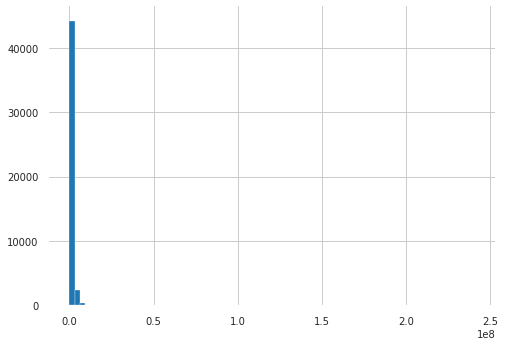

In [46]:
train['price'].hist(bins=77)
train.price.describe()

## Объединение данных

In [47]:
# для корректной обработки признаков объединяем трейн и тест в один датасет.
train['sample'] = 1  # помечаем где у нас трейн
test['sample'] = 0  # помечаем где у нас тест
# в тесте у нас нет значения price, мы его должны предсказать, 
# поэтому пока просто заполняем нулями
test['price'] = 0

# объединяем данные
data = test.append(train, sort=False).reset_index(drop=True)

print('Размерность финального датасета:', data.shape)
data.head(2)

Размерность финального датасета: (81918, 44)


,body_type,brand,color,complectation_dict,engine_displacement,engine_power,equipment_dict,fuel_type,mileage,model_date,model_name,number_doors,production_date,transmission,vendor,car_owners,pts,drive_type,wheel,pop_color,new,full,bargain,dealer,exchange,urgent,discount,extra,tires,rims,heating,service_incl,central_lock,power_windows,computer,airbag,power_steering,cruise_control,parking_sensors,child_car_seat,price_segment,car_age,sample,price
0,лифтбек,SKODA,синий,0,1.2,105.0,36,1,272.02941,2013,OCTAVIA,5,2014,3,1,3,1,2,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,8.0,0,0.0
1,лифтбек,SKODA,чёрный,0,1.6,110.0,34,1,246.09551,2017,OCTAVIA,5,2017,2,1,1,1,2,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,1,1,1,1,0,0,2,14.0,0,0.0


## Разбивка признаков по типам

In [48]:
# определим тип признаков датасета
data.nunique()

body_type                 10
brand                     13
color                      9
complectation_dict         2
engine_displacement       59
engine_power             382
equipment_dict           116
fuel_type                  3
mileage                26732
model_date                66
model_name               928
number_doors               5
production_date           70
transmission               4
vendor                     6
car_owners                 3
pts                        2
drive_type                 3
wheel                      2
pop_color                  2
new                        2
full                       2
bargain                    2
dealer                     2
exchange                   2
urgent                     2
discount                   2
extra                      2
tires                      2
rims                       2
heating                    2
service_incl               2
central_lock               2
power_windows              2
computer      

In [49]:
# объединим все полученные признаки по категориям
# 'sample', 'price исключили' из списка

bin_cols = ['complectation_dict', 'pts', 'wheel', 'new', 'perfect', 'very_good',
            'good', 'full', 'bargain', 'dealer', 'exchange', 'urgent', 'discount',
            'extra', 'tires', 'rims', 'heating', 'service_incl', 'central_lock',
            'power_windows', 'computer', 'airbag', 'power_steering', 'cruise_control ',
            'parking_sensors', 'pop_color', 'child_car_seat']
cat_cols = [
    'body_type', 'brand', 'color', 'fuel_type', 'transmission', 'vendor',
    'car_owners', 'drive_type', 'model_name', 'price_segment'
]
num_cols = [
    'engine_displacement', 'engine_power', 'equipment_dict', 'mileage', 'model_date',
    'number_doors', 'production_date', 'car_age']

# len(bin_cols+cat_cols+num_cols)

## Посмотрим на распределение числовых переменных

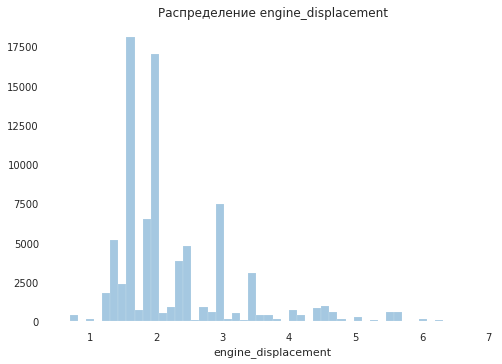

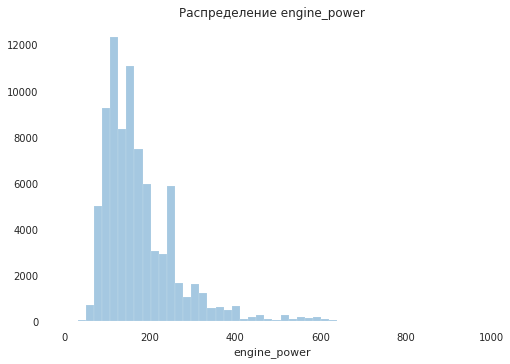

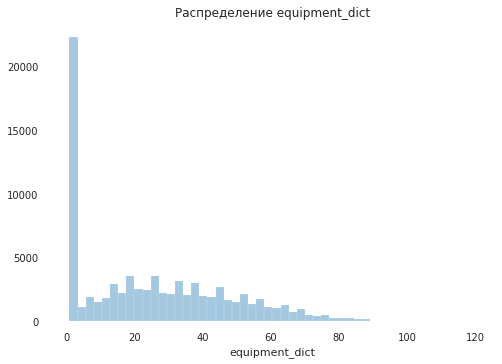

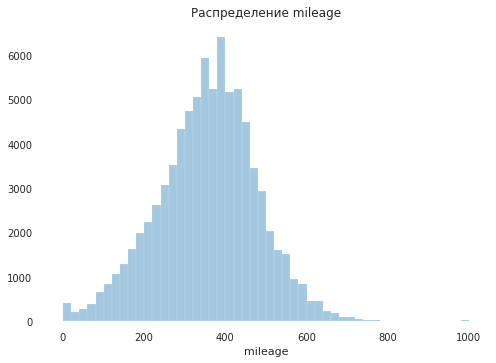

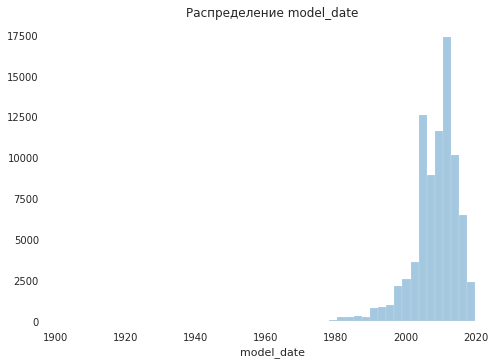

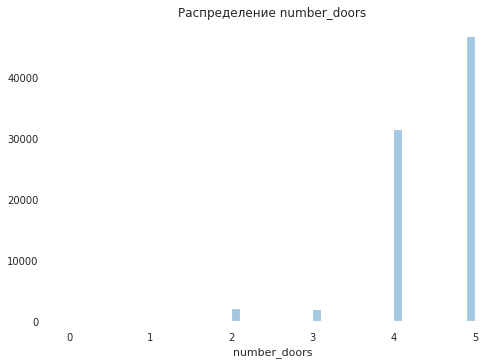

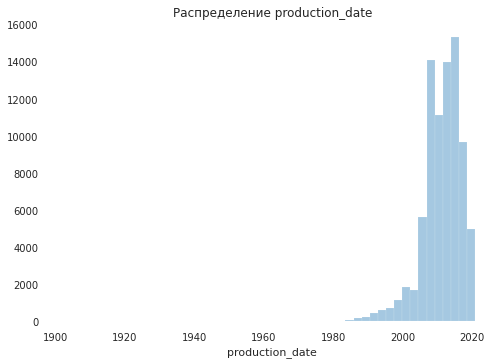

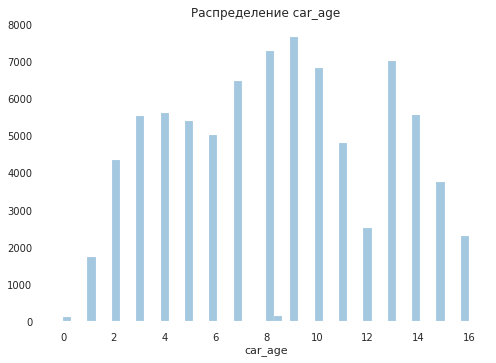

In [50]:
for col in num_cols:
    plt.figure()
    plt.title(f"Распределение {col}")
    sns.distplot(data[col], kde=False)

In [51]:
# прологорифмируем признаки и пробуем нормализовать их распределение
# cols_log = ['equipment_dict', 'model_date', 'production_date']
# for i in cols_log:
#     data[i] = np.log(data[i] + 1)
#     plt.figure(figsize=(10,6))
#     sns.distplot(data[i][data[i] > 0].dropna(), kde = False, rug=False)
#     plt.show()

<AxesSubplot:>

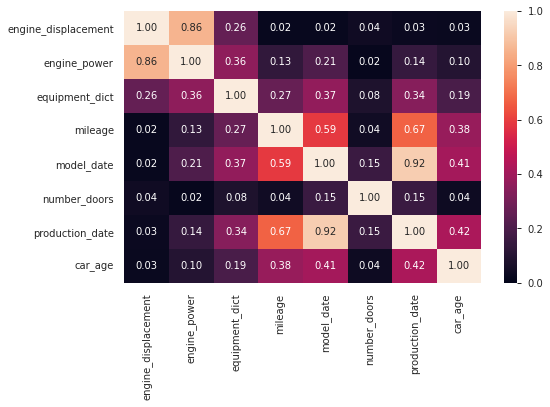

In [52]:
# посмотрим на корреляцию признаков между собой
plt.figure(figsize=(8, 5))
sns.heatmap(data[num_cols].corr().abs(), vmin=0, vmax=1, annot=True, fmt=".2f")

Видно что очень сильно коррелируют между собой 'engine_displacement'  и 'engine_power', а также 'model_date' и 'production_date'. Удалим по одному из этих признаков.

Text(0.5, 1.0, 'Значимость числовых признаков')

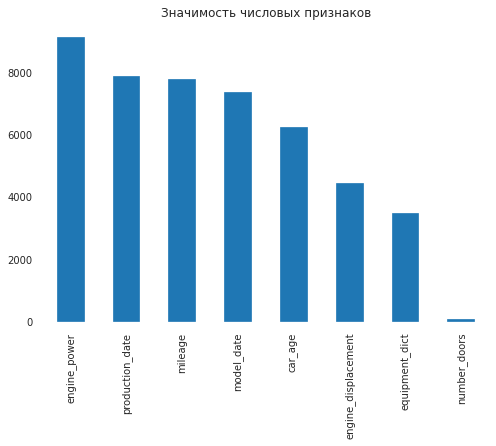

In [53]:
# используем дисперсионный анализ для определения значимости числовых признаков
imp_num = pd.Series(f_regression(
    data[num_cols], data["price"])[0], index=num_cols)
imp_num.sort_values(inplace=True, ascending=False)
imp_num.plot(kind="bar")
plt.title('Значимость числовых признаков')

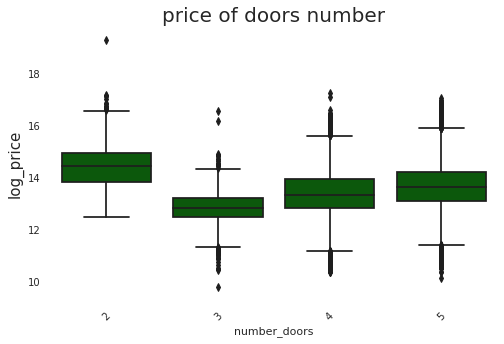

In [54]:
# чтобы оценить значимость признака 'number_doors', визуализируем его взаимосвязь
# с ценой

plt.figure(figsize=(8, 5))
g1 = sns.boxplot(y=np.log(train.price), x='number_doors',
                 data=train, color='darkgreen')
g1.set_title("price of doors number", fontsize=20)

g1.set_ylabel("log_price", fontsize=15)
g1.set_xticklabels(g1.get_xticklabels(), rotation=45)
plt.show()

In [55]:
# посмотрим на корреляцию
train[['number_doors', 'price']].corr(method='spearman')

,number_doors,price
number_doors,1.00000,0.16138
price,0.16138,1.00000


Вывод: По боксплоту видна зависимость цены от количества дверей, хотя они и слабо коррелируют, поэтому этот признак не удаляем.
Удалим model_date и engine_displacement  из датасета.

In [56]:
data.drop('model_date', axis=1, inplace=True)
data.drop('engine_displacement', axis=1, inplace=True)

## Категориальные признаки

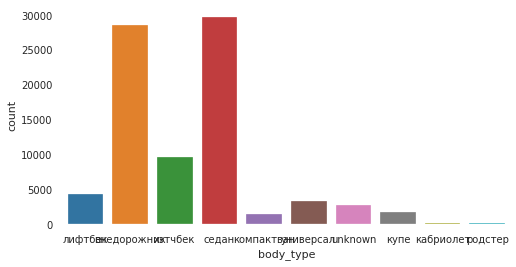

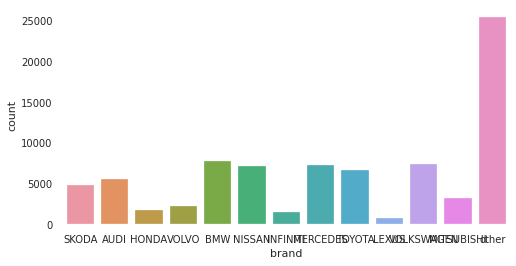

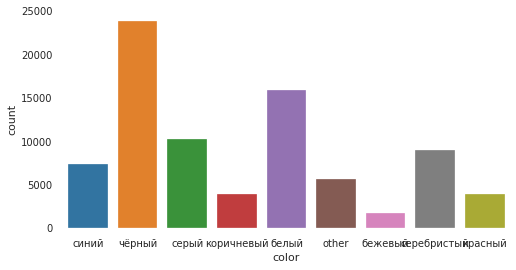

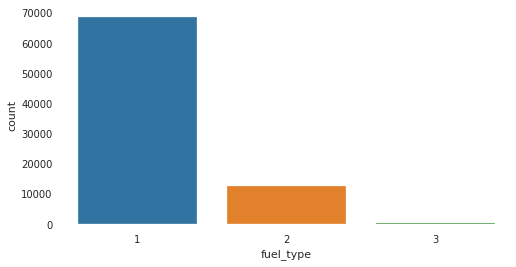

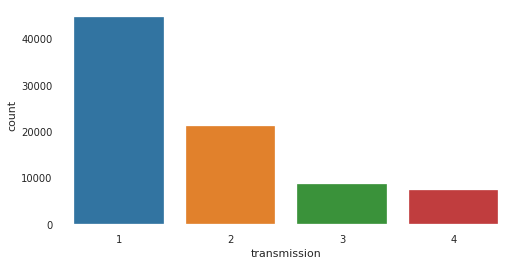

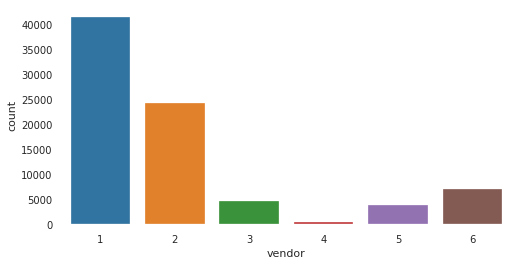

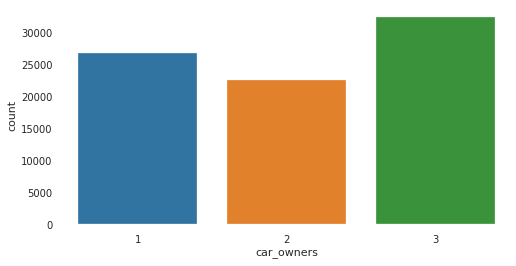

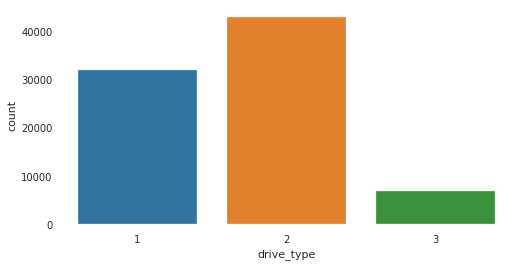

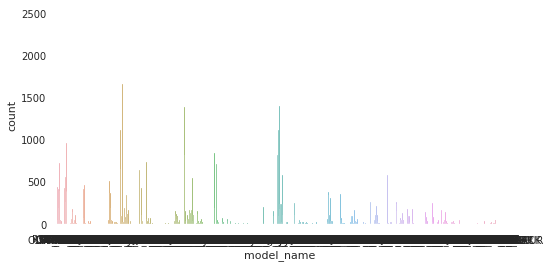

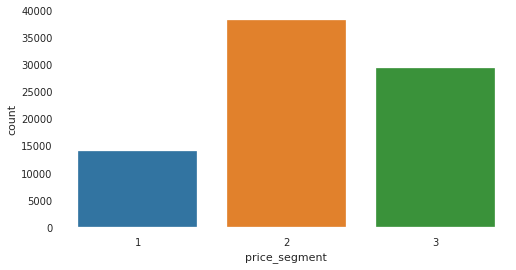

In [57]:
for col in cat_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data[col])

In [58]:
#  кодируем категориальные признаки
for column in cat_cols:
    data[column] = data[column].astype('category').cat.codes

Text(0.5, 1.0, 'Значимость категориальных признаков')

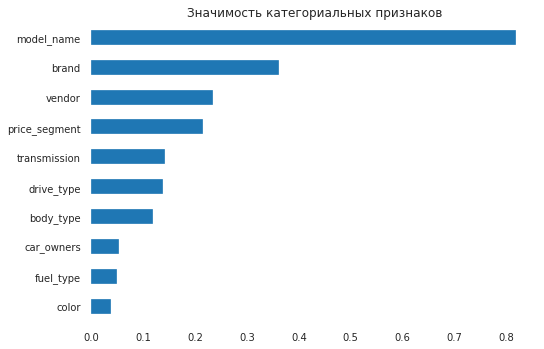

In [59]:
# определим значимость категориальных признаков
imp_cat = pd.Series(mutual_info_regression(pd.concat([data[cat_cols]], axis=1),
                                           data['price'], discrete_features=True),
                    index=pd.concat([data[cat_cols]], axis=1).columns)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind='barh')
plt.title('Значимость категориальных признаков')

In [60]:
# корреляция категориальных признаков между собой
corr = round(data[cat_cols].corr(method='spearman'), 1)
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

,body_type,brand,color,fuel_type,transmission,vendor,car_owners,drive_type,model_name,price_segment
body_type,1.000,0.100,-0.000,-0.300,0.100,0.100,0.200,0.600,-0.400,-0.200
brand,0.100,1.000,-0.100,-0.100,0.100,0.500,-0.100,0.200,0.100,-0.600
color,-0.000,-0.100,1.000,0.100,-0.100,-0.100,0.000,-0.100,-0.000,0.200
fuel_type,-0.300,-0.100,0.100,1.000,-0.200,-0.200,-0.100,-0.300,0.100,0.300
transmission,0.100,0.100,-0.100,-0.200,1.000,0.100,-0.000,0.100,0.000,-0.300
vendor,0.100,0.500,-0.100,-0.200,0.100,1.000,-0.100,0.100,0.000,-0.500
car_owners,0.200,-0.100,0.000,-0.100,-0.000,-0.100,1.000,0.100,-0.100,0.000
drive_type,0.600,0.200,-0.100,-0.300,0.100,0.100,0.100,1.000,-0.300,-0.300
model_name,-0.400,0.100,-0.000,0.100,0.000,0.000,-0.100,-0.300,1.000,-0.000
price_segment,-0.200,-0.600,0.200,0.300,-0.300,-0.500,0.000,-0.300,-0.000,1.000


Вывод:  'drive_type' и 'body_type' умеренно коррелируют между собой. Оставим все признаки без изменений.

## Бинарные признаки

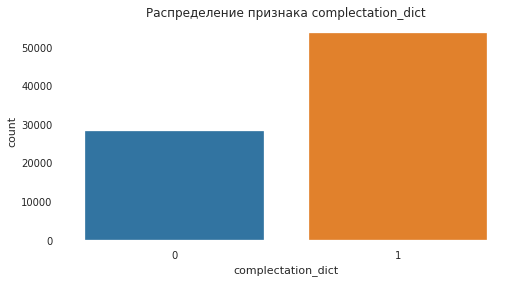

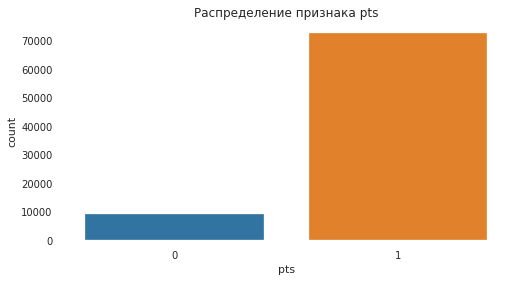

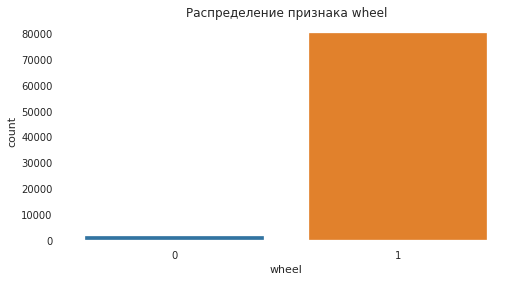

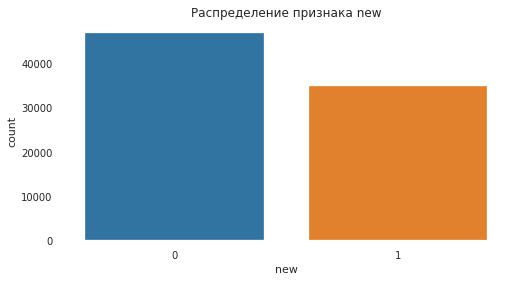

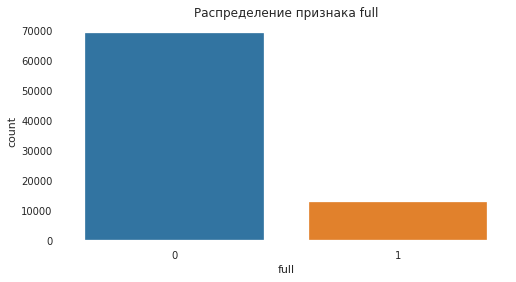

...

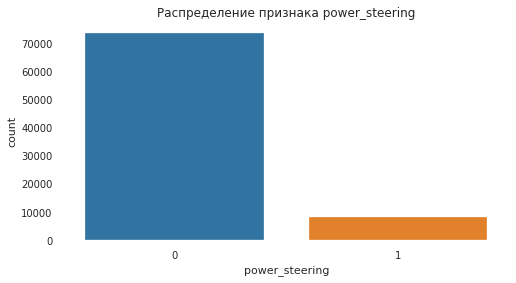

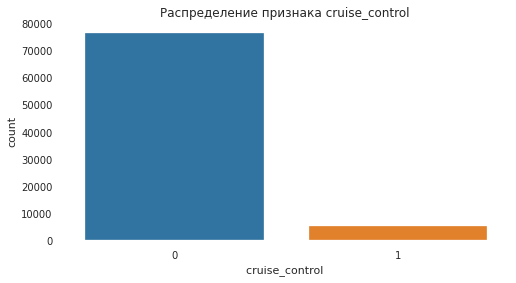

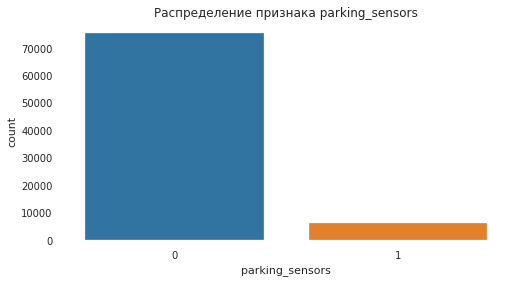

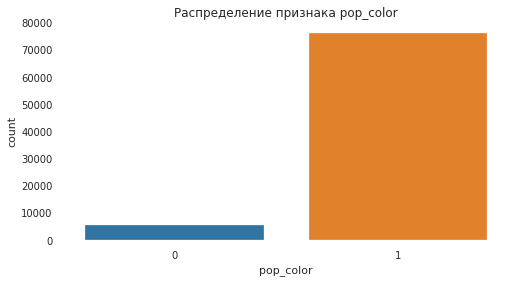

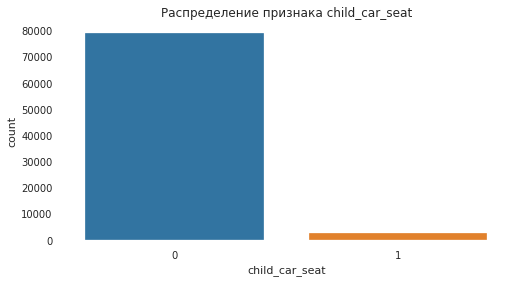

In [61]:
# посмотрим распределение бинарных признаков
for col in bin_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data[col])
    plt.title(f"Распределение признака {col}")

Text(0.5, 1.0, 'Значимость бинарных признаков')

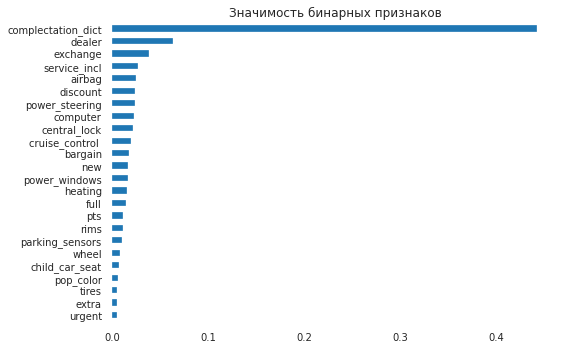

In [62]:
# значимость бинарных признаков
imp_bin = Series(mutual_info_regression(data[bin_cols], data['price'],
                                        discrete_features=True), index=bin_cols)
imp_bin.sort_values(inplace=True)
imp_bin.plot(kind='barh')
plt.title('Значимость бинарных признаков')

In [63]:
# проверяем данные после преобразования
data.head(5)

,body_type,brand,color,complectation_dict,engine_power,equipment_dict,fuel_type,mileage,model_name,number_doors,production_date,transmission,vendor,car_owners,pts,drive_type,wheel,pop_color,new,full,bargain,dealer,exchange,urgent,discount,extra,tires,rims,heating,service_incl,central_lock,power_windows,computer,airbag,power_steering,cruise_control,parking_sensors,child_car_seat,price_segment,car_age,sample,price
0,5,8,7,0,105.0,36,0,272.029410,574,5,2014,2,0,2,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8.0,0,0.0
1,5,8,8,0,110.0,34,0,246.095510,574,5,2017,1,0,0,1,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,1,1,1,1,0,0,1,14.0,0,0.0
2,5,8,6,1,152.0,55,0,296.647939,776,5,2014,2,0,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,14.0,0,0.0
3,5,8,3,1,110.0,52,0,308.220700,574,5,2014,0,0,0,1,1,1,1,1,0,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,7.0,0,0.0
4,5,8,2,0,152.0,29,0,241.942142,574,5,2012,0,0,0,1,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,1,1,1,1,0,0,1,13.0,0,0.0


In [64]:
# for cols in ['equipment_dict', 'production_date', 'mileage']:
#     data[cols]=data[cols].round(1)

## Подготовка к машинному обучению

In [65]:
# разделим снова на train и test, т.к. все признаки уже обработаны
train_data = data[data['sample'] == 1].drop(['sample'], axis=1)
test_data = data[data['sample'] == 0].drop(['sample'], axis=1)


# выделим целевую переменную и признаки
X = train_data.drop(['price'], axis=1)
y = train_data['price']


# standard scaler
# X = StandardScaler().fit_transform(X)


# разделим на тренировочные и валидационные выборки
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=VAL_SIZE, shuffle=True, random_state=RANDOM_SEED)

# прологарифмируем целевую переменную, тренировать модель будем на ней
y_train_log = np.log(y_train)

In [66]:
X_sub = data.query('sample == 0').drop(['sample'], axis=1)

# Модели

In [67]:
# функция отображения метрики модели
def print_learn_report(start, y_test, y_pred):
    print('\nВремя выполнения - ', datetime.now() - start)
    print(f"Точность по метрике MAPE:{(mape(y_test, y_pred))*100:0.2f}%")

## Обучение модели линейной регрессии

In [68]:
start = datetime.now()

# обучим модель
model_LR = LinearRegression().fit(X_train, y_train_log)
# делаем "логарифмированое" предсказание
y_pred_log = model_LR.predict(X_test)
# приводим цену к нужному формату: экспоненциируем
y_pred = np.exp(y_pred_log)

print_learn_report(start, y_test, y_pred)


Время выполнения -  0:00:00.066786
Точность по метрике MAPE:23.73%


## RandomForest

Определим лучшие параметры для случайного леса и обучим на них модель.

In [69]:
start = datetime.now()
# model_RF =  RandomForestRegressor()
# model_RF.fit(X_train, np.log(y_train))
# y_pred = np.exp(model_RF.predict(X_test))
# print_learn_report(start, y_test, y_pred)

random_grid = {'n_estimators': [int(x) for x in np.linspace(start=100, stop=400, num=4)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(5, 15, num=6)] + [None],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4],
               'bootstrap': [True, False]}

# rfr = RandomForestRegressor(random_state = RANDOM_SEED)
# rf_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=10, random_state=RANDOM_SEED, n_jobs = -1)
# rf_random.fit(X_train, np.log(y_train))
# rf_random.best_params_

# best_params_:
# {'n_estimators': 200,
# 'min_samples_split': 5,
# 'min_samples_leaf': 1,
# 'max_features': 'auto',
# 'max_depth': 15,
# 'bootstrap': True}

# best_rfr = rf_random.best_estimator_
best_rfr = RandomForestRegressor(random_state=RANDOM_SEED, n_estimators=200, min_samples_split=5,
                                 min_samples_leaf=1, max_features='auto', max_depth=15, bootstrap=True)

best_rfr.fit(X_train, np.log(y_train))

predict_rfr = np.exp(best_rfr.predict(X_test))
print_learn_report(start, y_test, predict_rfr)


Время выполнения -  0:00:36.913161
Точность по метрике MAPE:11.88%


## LightGBM

In [70]:
start = datetime.now()

# for e,i in enumerate([5, 50, 250, 500, 750, 2000, 3000, 4000, 15000, 30000]):
#     print(i)
#     regr_uquipment = lgb.LGBMRegressor(n_estimators=i)
#     regr_uquipment.fit(X_train,y_train_log)
#     y_pred = np.exp(regr_uquipment.predict(X_test))
#     print_learn_report(start, y_test, y_pred)

model_LGBM = lgb.LGBMRegressor(n_estimators=2000)
model_LGBM.fit(X_train, np.log(y_train))

y_pred = np.exp(model_LGBM.predict(X_test))
print_learn_report(start, y_test, y_pred)


Время выполнения -  0:00:05.738054
Точность по метрике MAPE:11.22%


## XGBRegressor

In [71]:
start = datetime.now()

model_XGBR = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.5,
                              learning_rate=0.05, max_depth=12, alpha=1,
                              n_estimators=1000)
model_XGBR.fit(X_train, np.log(y_train))

y_pred = np.exp(model_XGBR.predict(X_test))
print_learn_report(start, y_test, y_pred)


Время выполнения -  0:00:41.669957
Точность по метрике MAPE:10.90%


## CatboostRegressor

In [72]:
start = datetime.now()
model_CBR = CatBoostRegressor(iterations=ITERATIONS,
                              learning_rate=LR,
                              random_seed=RANDOM_SEED,
                              eval_metric='MAPE',
                              custom_metric=['R2', 'MAE']
                              )
model_CBR.fit(X_train, y_train_log,
              #          cat_features=cat_features_ids,
              eval_set=(X_test, np.log(y_test)),
              verbose_eval=100,
              use_best_model=True,
              plot=True
              )
y_pred = np.exp(model_CBR.predict(X_test))
print_learn_report(start, y_test, y_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.0479500	test: 0.0486635	best: 0.0486635 (0)	total: 62.4ms	remaining: 2m 4s
100:	learn: 0.0105057	test: 0.0106570	best: 0.0106570 (100)	total: 624ms	remaining: 11.7s
200:	learn: 0.0092642	test: 0.0095399	best: 0.0095399 (200)	total: 1.21s	remaining: 10.8s
300:	learn: 0.0086535	test: 0.0090618	best: 0.0090618 (300)	total: 1.76s	remaining: 9.91s
400:	learn: 0.0082576	test: 0.0087773	best: 0.0087773 (400)	total: 2.34s	remaining: 9.35s
500:	learn: 0.0079647	test: 0.0085952	best: 0.0085952 (500)	total: 2.95s	remaining: 8.82s
600:	learn: 0.0077401	test: 0.0084893	best: 0.0084893 (600)	total: 3.5s	remaining: 8.15s
700:	learn: 0.0075475	test: 0.0084049	best: 0.0084049 (700)	total: 4.14s	remaining: 7.67s
800:	learn: 0.0073812	test: 0.0083364	best: 0.0083364 (800)	total: 4.69s	remaining: 7.03s
900:	learn: 0.0072355	test: 0.0082827	best: 0.0082827 (900)	total: 5.31s	remaining: 6.48s
1000:	learn: 0.0071055	test: 0.0082421	best: 0.0082421 (1000)	total: 5.91s	remaining: 5.9s
1100:	learn: 

In [73]:
model_CBR.save_model('catboost_model_opt.model_CBR')

In [74]:
start = datetime.now()
# подбираем гиперпараметры для моделей с лучшими показателями
model = CatBoostRegressor(iterations=50,
                          loss_function='MAPE',
                          metric_period=10)
# оптимальные параметры
grid = {
    'learning_rate': [0.1, 0.13, 0.14, 0.15],
    'depth': [10, 11, 12],
    'l2_leaf_reg': [7, 7.5, 8],
    'random_strength': [0.2, 0.3, 0.4]
}

# grid_search_result = model.grid_search(
#     grid, X=X_train, y=np.log(y_train), plot=False, verbose=False, cv=3)

# grid_search_result['params']

# обучаем модель с оптимальными гиперпараметрами
optimal_parameters = {
    'depth': 12,
    'l2_leaf_reg': 8,
    'random_strength': 0.2,
    'learning_rate': 0.15
}

model_opt = CatBoostRegressor().set_params(**optimal_parameters)
model_opt.fit(X_train, np.log(y_train), verbose=False)

y_pred = np.exp(model_opt.predict(X_test))

print_learn_report(start, y_test, y_pred)


Время выполнения -  0:01:19.169585
Точность по метрике MAPE:11.36%


Вывод: подбор параметров не дал значительного улучшения, лучшие показатели так и остались у CatBoost модели.

# Bagging 

cо случайным лесом

In [75]:
start = datetime.now()

bagg_rfr = BaggingRegressor(
    best_rfr, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
bagg_rfr.fit(X_train, np.log(y_train))
predict_bagg_rfr = np.exp(bagg_rfr.predict(X_test))
print_learn_report(start, y_test, predict_bagg_rfr)


Время выполнения -  0:01:12.162322
Точность по метрике MAPE:12.07%


# Bagging 

c LightGBM

In [76]:
start = datetime.now()

bagg_LGBM = BaggingRegressor(
    model_LGBM, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
bagg_LGBM.fit(X_train, np.log(y_train))
predict_bagg_rfr = np.exp(bagg_LGBM.predict(X_test))
print_learn_report(start, y_test, predict_bagg_rfr)


Время выполнения -  0:00:15.646650
Точность по метрике MAPE:11.22%


# Bagging 

c XGB

In [77]:
start = datetime.now()

bagg_XGB = BaggingRegressor(
    model_XGBR, n_estimators=3, n_jobs=1, random_state=RANDOM_SEED)
bagg_XGB.fit(X_train, np.log(y_train))
predict_bagg_xgb = np.exp(bagg_XGB.predict(X_test))
print_learn_report(start, y_test, predict_bagg_xgb)


Время выполнения -  0:02:02.565020
Точность по метрике MAPE:10.99%


Вывод: в результате применения бэггинга результаты для LightGBM, Random Forest Regressor и XGB Regressor снизились.

## Stacking. Ансамбли моделей

In [78]:
start = datetime.now()

estimators = [('lgbm', lgb.LGBMRegressor(n_estimators=2000, random_state=RANDOM_SEED)), ('xgb', xgb.XGBRegressor(
    objective='reg:squarederror', colsample_bytree=0.5, learning_rate=0.05, max_depth=12, alpha=1, n_estimators=1000))]

st_ensemble = StackingRegressor(estimators=estimators, final_estimator=CatBoostRegressor(iterations=2000, random_seed=RANDOM_SEED,
                                                                                         eval_metric='MAPE', custom_metric=['R2', 'MAE'], silent=True, learning_rate=0.15, depth=12, l2_leaf_reg=8, random_strength=0.2))


st_ensemble.fit(X_train, np.log(y_train))

predict_ensemble = np.exp(st_ensemble.predict(X_test))
print_learn_report(start, y_test, predict_ensemble)


Время выполнения -  0:04:56.359493
Точность по метрике MAPE:11.27%


## Submission

In [79]:
predict_submission = np.exp(model_CBR.predict(X_sub))
predict_submission

array([ 600431.14759936,  785431.1433575 ,  768703.33904037, ...,
        619938.8051124 , 1819250.07352644, 1153161.59400176])

In [80]:
sample_submission['price'] = predict_submission
sample_submission.to_csv(f'submission_v{VERSION}.csv', index=False)
sample_submission.head(10)

,sell_id,price
0,1100575026,6.004311e+05
1,1100549428,7.854311e+05
2,1100658222,7.687033e+05
3,1100937408,7.198399e+05
4,1101037972,7.123663e+05
5,1100912634,7.499088e+05
6,1101228730,6.729694e+05
7,1100165896,4.270996e+05
8,1100768262,1.510140e+06
9,1101218501,1.044384e+06


## Выводы:

Мы обработали тестовый датасет и тренировочный датасеты, чтобы набор характеристик автомобилей соответствовали друг другу.

Целевая переменная перекошена, поэтому ее прологарифмируем, его и будем предсказывать, чтобы распрделение было более нормальным, это влияет на качество предсказаний регрессии.

Признаки содержат выбросы, удаляем только самые явные.

В столбце sell_id в тренировочной выборке есть дубликаты, мы их удалили.

В тестовом датасете меньше марок, чем в тренировочном, поэтому сформируем список  из тех марок, что указаны в тесте, остальные отнесли к категории – другое.

Чем больше пробег, тем ниже цена на авто. Средний пробег - приблизительно 100 км.
Есть зависимость между объемом двигателя и ценой автомобиля: чем больше объем, тем, в среднем, выше цена.
Большинство автомобилей имеют мощность двигателя от 150 до 300 л.с.,чем мощнее двигатель, тем выше цена.
Если информация о комплектации отсутствует, мы заполняли пропуски нулями.
Добавлен признак - возраст автомобиля. Большинство автомобилей в тренировочной выборке имеют возраст  3 - 10 лет,средний возраст автомобиля - примерно 7.5 лет, чем старше автомобиль, тем он дешевле.
На основе пробега авто создавали новый признак пробег авто в год по возрасту авто - km_year. Этот признак также не улучшил показатели.

Дополнительные характеристики из описания мы вычленили, проанализировав самые популярные, из них сделали дополнительные признаки.

Автомобили с автоматической коробкой передач стоят дороже, а с механической - дешевле.
Автомобили с задним приводом стоят дороже, а с передним - дешевле.
Существуют метки премиум-класса напротив определенных марок автомобилей например,MERCEDES, отразили это , добавив признак класса автомобиля.
Мы провели многочисленные проверки работы моделей, в том числе с подобранными гиперпараметрами, пытались использовать бэггинг и стеккинг.

Кроме того, пытались учитывать экономические показатели. Так как тестовый датасет создавался в 2020 году, а новый датасет 2021, цену в трейне умножили на отношение среднего курса рубля в 2020 к сегодняшнему курсу.

Стеккинг использовали только для лучших моделей, так как метод требует много времени для обработки.
Лучший результат показала оптимизированная модель CatboostRegressor.
Мы считаем, что при сабмите нужно учитывать изменение рынка и ценообразования за последний год, минимум 10%.
Финальный результат метрики MAPE на лучшей модели - 10.89%

## What's next?
Что еще можно сделать, чтобы улучшить результат:

- Попробовать обоготить данные, другие варианты обработки признаков
- Попробовать другие алгоритмы и библиотеки ML,их оптимизацию и подбор гиперпараметров
- Сгенерировать новые признаки
- Подгрузить еще больше данных
- Использование Blending & Stacking не принесло ожидаемого улучшения качества предсказаний. Наилучший результат имело применение Random Forest с регуляризацией.
